In [ ]:
##This cell is for downloading and preparing data
#-------------------------------------------------
#gdown is used for downloading dataset to storage
!pip install gdown
#Downloading dataset
import gdown
file_id = ""  # Replace this with your file's ID
output_file = "data_file.zip"  # Replace "data_file.ext" with the desired output filename and extension
gdown.download(f"https://drive.google.com/uc?id={file_id}", output_file)


In [2]:
%%capture
!pip install wurlitzer
!pip install transunet

In [3]:
%%capture
#Extracting zip file
!unzip data_file.zip

In [4]:
#General Imports
import matplotlib.pyplot as plt
import cv2
import numpy as np
import pandas as pd
import os
import tensorflow as tf
import keras

2024-03-30 00:00:21.098158: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-03-30 00:00:21.098283: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-03-30 00:00:21.204078: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [5]:
#Numpy Random Seed for reproducability
np.random.seed(32)

In [6]:
#Helper functions
def random_split_array(data, ratios=(0.8, 0.1, 0.1)):
    np.random.shuffle(data)  # Shuffle for randomness
    split_indices = np.cumsum(ratios[:-1]) * len(data)
    return np.split(data, split_indices.astype(int))

In [7]:
#Train-test-val split
original = []
for i in range(131) :
    original.append(i)

train, test, val = random_split_array(original,(0.8,0.1,0.1))

#These arrays will contain paths of images, and liver mask
X_train = []
Y_train = []
X_test = []
Y_test = []
X_val = []
Y_val = []

scan_list = os.listdir("//kaggle/working/Task03_Liver")
scan_list.sort()
for i in scan_list:
    num = int(i.split("_")[-1])
    path = "/kaggle/working/Task03_Liver/" + i
    imgpath = path + "/images"
    maskpath = path + "/masks"
    piclist = os.listdir(imgpath)
    if num in train:
        for j in piclist:
            X_train.append(imgpath + "/" + j)
            Y_train.append(maskpath + "/liver/" +j)
    elif num in test:
        for j in piclist:
            X_test.append(imgpath + "/" + j)
            Y_test.append(maskpath + "/liver/" +j)
    else:
        for j in piclist:
            X_val.append(imgpath + "/" + j)
            Y_val.append(maskpath + "/liver/" +j)



In [8]:
#This function will convert the path to the actual image by loading it from the memory.
def load_and_preprocess_3(image_path):
    image = tf.io.read_file(image_path)
    image = tf.image.decode_jpeg(image, channels=1)  # Or the format of your images
    image = tf.image.resize(image, [256, 256])
    image = tf.cast(image, tf.float32) / 255.0
    image = tf.image.grayscale_to_rgb(image)
    return image

def load_and_preprocess_1(image_path):
    image = tf.io.read_file(image_path)
    image = tf.image.decode_jpeg(image, channels=1)  # Or the format of your images
    image = tf.image.resize(image, [256, 256])
    image = tf.cast(image, tf.float32) / 255.0
    return image

def augfun(image,mask):
    angle = tf.random.uniform(shape=[], minval=0, maxval=360, dtype=tf.float32)
    image = tf.image.rot90(image, k=tf.cast(angle / 90, tf.int32))
    mask = tf.image.rot90(mask, k=tf.cast(angle / 90, tf.int32))
    return (image,mask)

#Generating tf datasets
image_ds = tf.data.Dataset.from_tensor_slices(X_train)
image_ds = image_ds.map(load_and_preprocess_3, num_parallel_calls=tf.data.AUTOTUNE)
mask_ds = tf.data.Dataset.from_tensor_slices(Y_train)
mask_ds = mask_ds.map(load_and_preprocess_1, num_parallel_calls=tf.data.AUTOTUNE)
train_ds = tf.data.Dataset.zip((image_ds,mask_ds))
train_ds  = train_ds.map(augfun, num_parallel_calls = tf.data.AUTOTUNE)
image1_ds = tf.data.Dataset.from_tensor_slices(X_val)
image1_ds = image1_ds.map(load_and_preprocess_3, num_parallel_calls=tf.data.AUTOTUNE)
mask1_ds = tf.data.Dataset.from_tensor_slices(Y_val)
mask1_ds = mask1_ds.map(load_and_preprocess_1, num_parallel_calls=tf.data.AUTOTUNE)
val_ds = tf.data.Dataset.zip((image1_ds,mask1_ds))

image2_ds = tf.data.Dataset.from_tensor_slices(X_test)
image2_ds = image2_ds.map(load_and_preprocess_3, num_parallel_calls=tf.data.AUTOTUNE)
mask2_ds = tf.data.Dataset.from_tensor_slices(Y_test)
mask2_ds = mask2_ds.map(load_and_preprocess_1, num_parallel_calls=tf.data.AUTOTUNE)
test_ds = tf.data.Dataset.zip((image2_ds,mask2_ds))

In [9]:
c = 0
xtr = [] 
ytr = []
for i in train_ds:
        x,y = i
        xtr.append(x)
        ytr.append(y)
        c+=1
        if (c==100):
            break

Data Augmentation Verified

In [10]:
from transunet import TransUNet
model = TransUNet(image_size=256, pretrain=True, hybrid=True, num_classes=1)

/opt/conda/lib/python3.10/site-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(


461217452/461217452 [==============================] - 35s 0us/step


/opt/conda/lib/python3.10/site-packages/transunet/utils.py:82: UserWarning: Resizing position embeddings from 14 to 16
  warnings.warn(


In [11]:
model.summary()

Model: "TransUNet"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 262, 262, 3)          0         ['input_2[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 128, 128, 64)         9472      ['conv1_pad[0][0]']           
                                                                                                  
 pool1_pad (ZeroPadding2D)   (None, 130, 130, 64)         0         ['conv1_conv[0][0]']          
                                                                                          

In [12]:
for i in train_ds:
    x,y = i
    print(x.shape)
    print(y.shape)
    break

(256, 256, 3)
(256, 256, 1)


In [13]:
#Defining dice loss functions. dice is actual dice-function value, while dice_loss is 1-dice. if dice_loss is minimized, dice is maximized.
def dice_loss(y_true,y_pred):
    return  -dice(y_true,y_pred)

def dice(y_true,y_pred):
    y_true = tf.cast(y_true, tf.float32)
    numerator = 2. * tf.reduce_sum(y_true * y_pred) + 1e-6
    denominator = tf.reduce_sum(y_true + y_pred) + 1e-6
    dice = numerator / (denominator)
    return dice

In [14]:
#General callbacks
from tensorflow.keras.callbacks import ModelCheckpoint, LearningRateScheduler, EarlyStopping, ReduceLROnPlateau
weight_path="{}.weights.h5.keras".format('cxr_reg')

checkpoint = ModelCheckpoint(weight_path, monitor='val_dice_loss', verbose=1,
                             save_best_only=True, mode='min', save_weights_only = False)

reduceLROnPlat = ReduceLROnPlateau(monitor='val_dice_loss', factor=0.2,
                                   patience=5,
                                   verbose=1, mode='min', epsilon=0.0001, cooldown=2, min_lr=1e-8)
early = EarlyStopping(monitor="val_dice_loss",
                      mode="min",
                      patience=10) # probably needs to be more patient, but kaggle time is limited
callbacks_list = [checkpoint, early, reduceLROnPlat]

In [15]:
BATCH_SIZE = 30
train_ds = train_ds.shuffle(buffer_size=100)  # Shuffle dataset for better training
train_ds = train_ds.batch(BATCH_SIZE)
train_ds = train_ds.prefetch(buffer_size=tf.data.AUTOTUNE)
val_ds = val_ds.batch(BATCH_SIZE)

In [16]:
for i in train_ds:
    x,y = i
    print(x.shape)
    print(y.shape)
    break

(30, 256, 256, 3)
(30, 256, 256, 1)


In [17]:
#AdamW optimizer
model.compile(optimizer=tf.keras.optimizers.SGD(learning_rate = 0.01, momentum=0.9, weight_decay=1e-4), loss=dice_loss, metrics = [dice, dice_loss])

In [18]:
#Training the Model
history = model.fit(train_ds,
    epochs=100,
    validation_data=val_ds,
    callbacks = callbacks_list,
)

Epoch 1/100


I0000 00:00:1711756923.056066      87 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


498/498 [==============================] - ETA: 0s - loss: -0.6836 - dice: 0.8269 - dice_loss: -0.8269
Epoch 1: val_dice_loss improved from inf to -0.79629, saving model to cxr_reg.weights.h5.keras
498/498 [==============================] - 667s 1s/step - loss: -0.6836 - dice: 0.8269 - dice_loss: -0.8269 - val_loss: -0.6542 - val_dice: 0.7963 - val_dice_loss: -0.7963 - lr: 0.0100
Epoch 2/100
498/498 [==============================] - ETA: 0s - loss: -0.8052 - dice: 0.9460 - dice_loss: -0.9460
Epoch 2: val_dice_loss improved from -0.79629 to -0.89366, saving model to cxr_reg.weights.h5.keras
498/498 [==============================] - 601s 1s/step - loss: -0.8052 - dice: 0.9460 - dice_loss: -0.9460 - val_loss: -0.7542 - val_dice: 0.8937 - val_dice_loss: -0.8937 - lr: 0.0100
Epoch 3/100
498/498 [==============================] - ETA: 0s - loss: -0.8164 - dice: 0.9544 - dice_loss: -0.9544
Epoch 3: val_dice_loss improved from -0.89366 to -0.93753, saving model to cxr_reg.weights.h5.keras
49

In [19]:
#Loading best validation weights for testing further
model.load_weights("/kaggle/working/cxr_reg.weights.h5.keras")

In [20]:
#Generating test arrays from test_ds
Xts =[]
Yts =[]
for i in test_ds:
    x,y=i
    Xts.append(x)
    Yts.append(y)

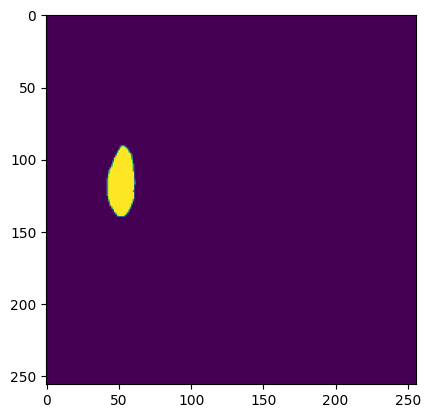

In [21]:
#checking image mask pair correspondance
#This is mask
plt.imshow(Yts[23])

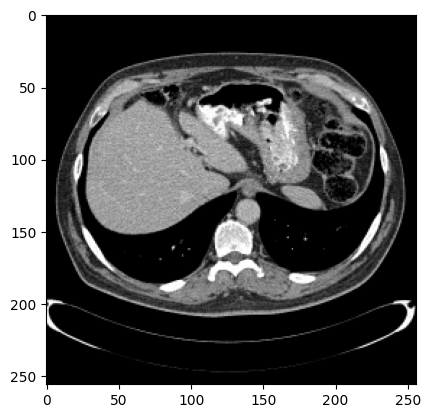

In [22]:
#This is corresponding image
plt.imshow(Xts[19])

In [23]:
#Evaluating model on test dataset
model.evaluate(np.array(Xts),np.array(Yts))

63/63 [==============================] - 35s 447ms/step - loss: -0.8717 - dice: 0.9593 - dice_loss: -0.9593


[-0.8717072010040283, 0.9593404531478882, -0.9593404531478882]

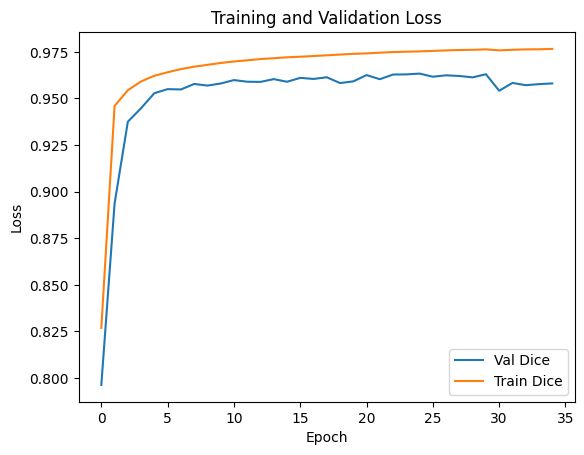

In [24]:
#Training and validation loss curves
plt.plot(history.history['val_dice'], label='Val Dice')
plt.plot(history.history['dice'], label='Train Dice')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

4/4 [==============================] - 5s 321ms/step


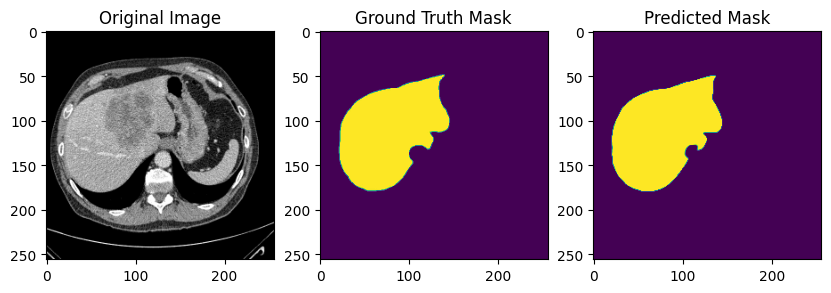

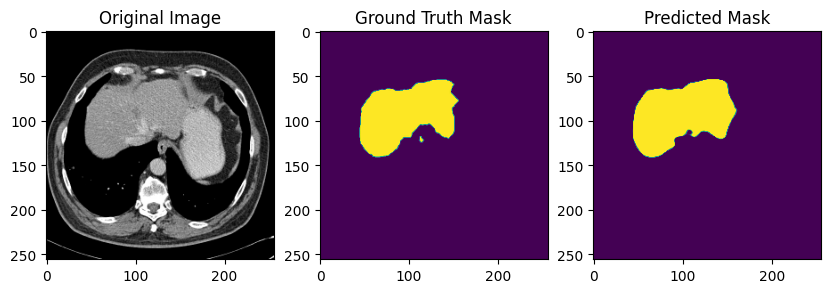

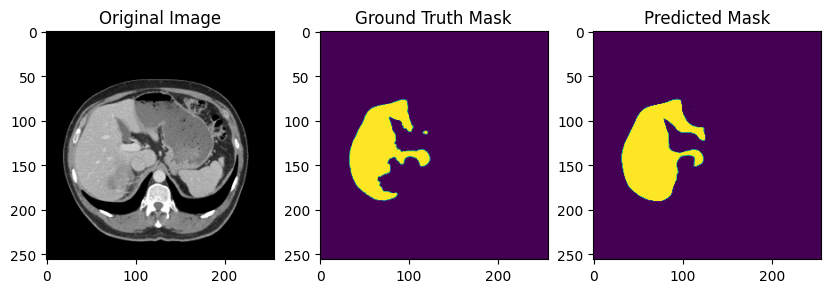

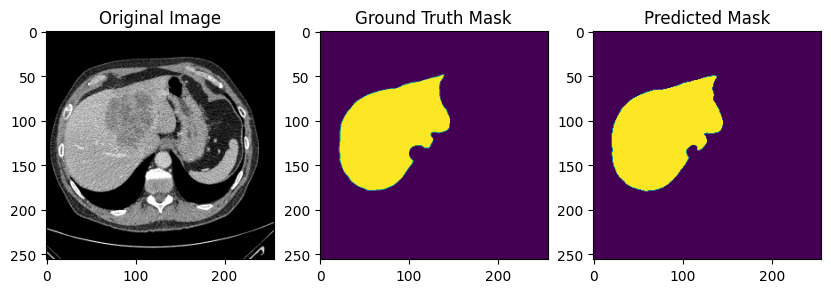

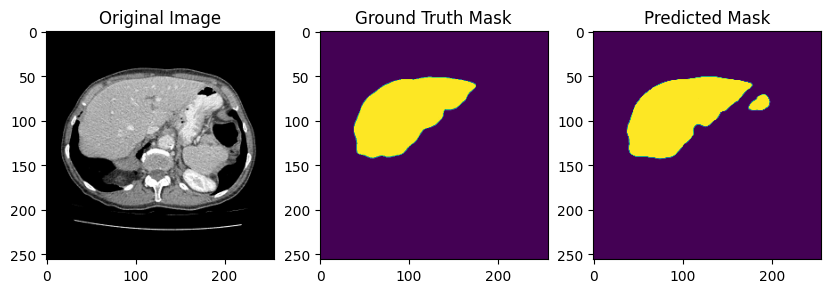

...

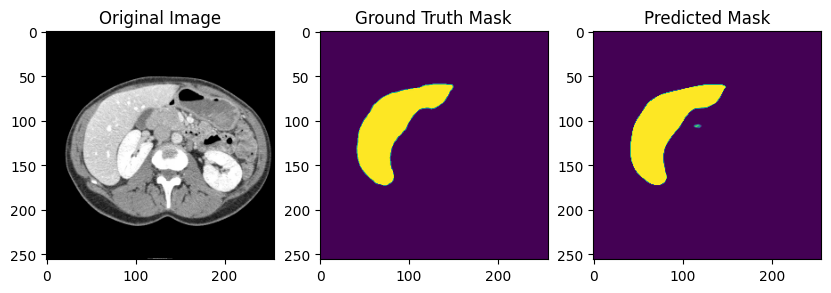

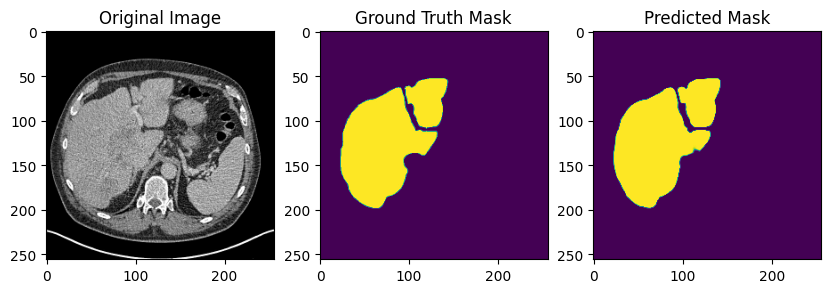

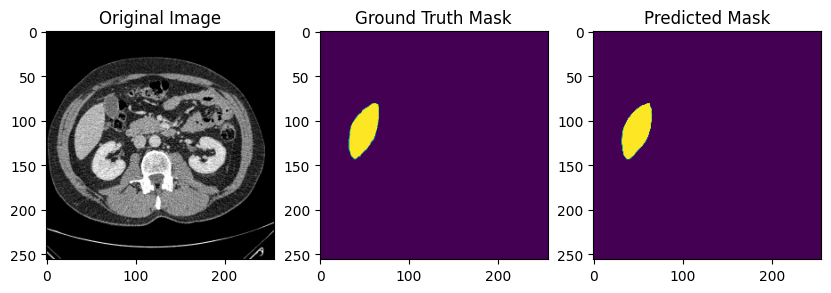

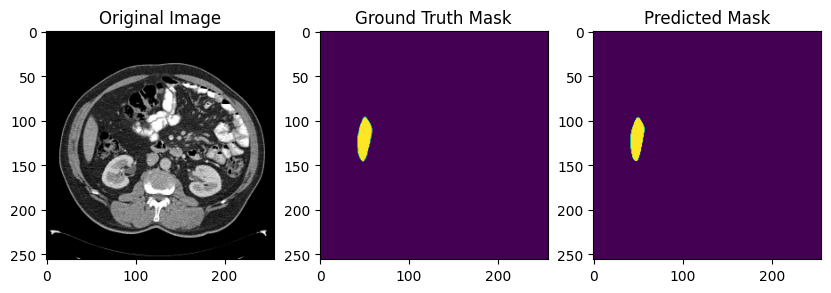

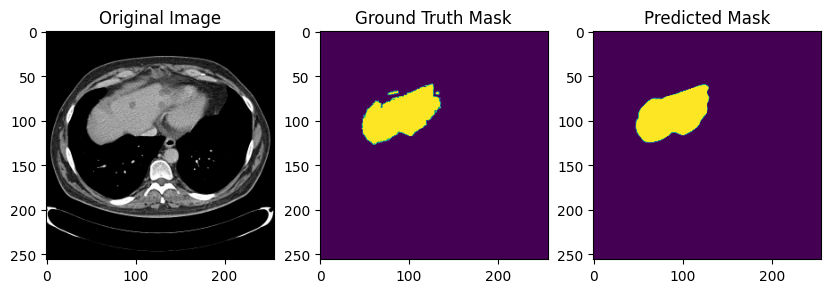

In [25]:
##This section chooses 100 random images from X_test and Y_test and shows the model output on them, along with input and ground truth
import random
# Select 100 random images from X_test and Y_test
random_indices = random.sample(range(len(X_test)), 100)
selected_X_test = [X_test[i] for i in random_indices]
selected_Y_test = [Y_test[i] for i in random_indices]
g3 = lambda x:load_and_preprocess_3(x)
g1 = lambda x:load_and_preprocess_1(x)
imgs = [g3(x) for x in selected_X_test]
# Evaluate the model on the selected images
y_pred = model.predict(np.array(imgs))

# Compare the model output and Y
for i in range(100):
  plt.figure(figsize=(10, 5))

  # Original image
  plt.subplot(1, 3, 1)
  plt.imshow(g3(selected_X_test[i]))
  plt.title('Original Image')

  # Ground truth mask
  plt.subplot(1, 3, 2)
  plt.imshow(g1(selected_Y_test[i]))
  plt.title('Ground Truth Mask')

  # Predicted mask
  plt.subplot(1, 3, 3)
  plt.imshow(y_pred[i])
  plt.title('Predicted Mask')

  plt.show()


In [26]:
# !zip /content/wts.zip /content/cxr_reg.weights.h5.keras

In [27]:
# !cp /content/wts.zip /content/drive/MyDrive